In [ ]:
pip install opencv-python

In [ ]:
!pip install pyyaml==5.1

import torch
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)

torch:  1.10 ; cuda:  cu111


In [ ]:
!pip install pytorch3d

Demo 

# Install detectron2

In [ ]:
# install dependencies
#!pip install -U torch torchvision cython
!pip install -U 'git+https://github.com/facebookresearch/fvcore.git' 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'
#import torch, torchvision
#torch.__version__

  Cloning https://github.com/facebookresearch/fvcore.git to /tmp/pip-req-build-gqcaj5ut
  Running command git clone -q https://github.com/facebookresearch/fvcore.git /tmp/pip-req-build-gqcaj5ut
  Cloning https://github.com/cocodataset/cocoapi.git to /tmp/pip-req-build-md33q74e
  Running command git clone -q https://github.com/cocodataset/cocoapi.git /tmp/pip-req-build-md33q74e
  Created wheel for pycocotools: filename=pycocotools-2.0-cp37-cp37m-linux_x86_64.whl size=263959 sha256=62466b0daa635eb6b83341e8868aa9e263f7514c5d049da731c98584ec50d9e1
  Stored in directory: /tmp/pip-ephem-wheel-cache-ck832ixv/wheels/e2/6b/1d/344ac773c7495ea0b85eb228bc66daec7400a143a92d36b7b1
Successfully built pycocotools
  Attempting uninstall: pycocotools
    Found existing installation: pycocotools 2.0.4
    Uninstalling pycocotools-2.0.4:
      Successfully uninstalled pycocotools-2.0.4
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour

In [ ]:
#!pip install torch==1.10.0

In [ ]:
!python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'



  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-yvtc25k_
  Running command git clone -q https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-yvtc25k_
  Using cached pycocotools-2.0.4-cp37-cp37m-linux_x86_64.whl
  Attempting uninstall: pycocotools
    Found existing installation: pycocotools 2.0
    Uninstalling pycocotools-2.0:
      Successfully uninstalled pycocotools-2.0


In [ ]:
# You may need to restart your runtime prior to this, to let your installation take effect

# Some basic setup

# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import cv2
import random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog

# Run a pre-trained detectron2 model

In [ ]:
!pip install flask-ngrok

In [ ]:
! pip install pyngrok

In [ ]:
! ngrok authtoken 23Dcng4pakR8AcYo4dpb5keiSxb_8FdJ2M9LkF8w8EVt1QUc

We first download a random image from the COCO dataset:

--2022-01-24 05:12:16--  http://bluechipai.asia/vid/s5.png
Resolving bluechipai.asia (bluechipai.asia)... 173.201.177.241
Connecting to bluechipai.asia (bluechipai.asia)|173.201.177.241|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1356517 (1.3M) [image/png]
Saving to: ‘input.jpg’

input.jpg           100%[===================>]   1.29M  1.04MB/s    in 1.2s    

2022-01-24 05:12:17 (1.04 MB/s) - ‘input.jpg’ saved [1356517/1356517]



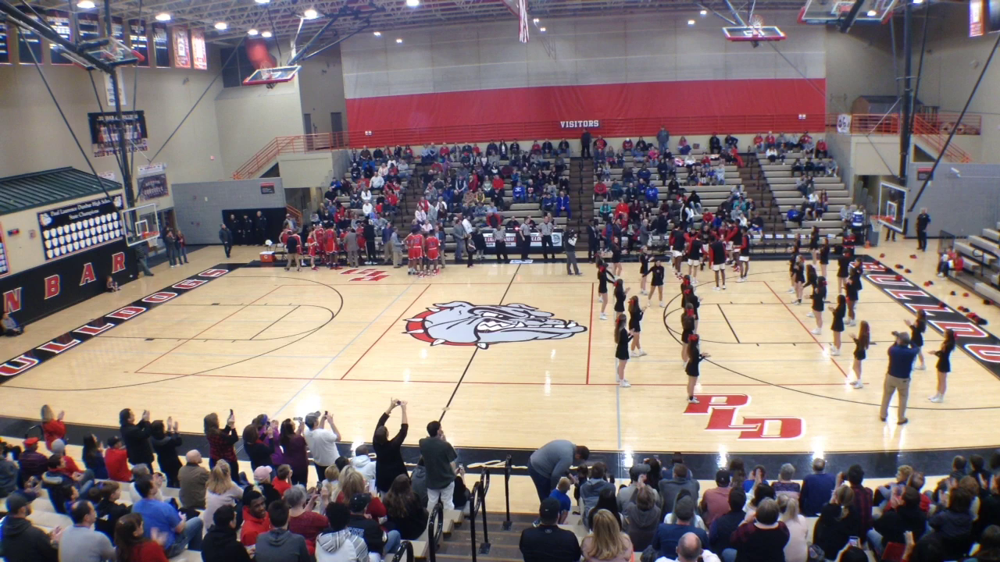

In [ ]:
!wget http://bluechipai.asia/vid/s5.png -O input.jpg
im = cv2.imread("./input.jpg")
cv2_imshow(im)

Then, we create a detectron2 config and a detectron2 `DefaultPredictor` to run inference on this image.

In [ ]:
!git clone https://github.com/facebookresearch/detectron2 detectron2_repo


fatal: destination path 'detectron2_repo' already exists and is not an empty directory.


In [ ]:
!pip install -e detectron2_repo


In [ ]:
#from google.colab import drive
#drive.mount("/content/drive", force_remount=True)


cfg = get_cfg()
#cfg.merge_from_other_cfg
cfg.merge_from_file("./detectron2_repo/configs/COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")

cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # set threshold for this model

cfg.MODEL.WEIGHTS = "detectron2://COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x/137849600/model_final_f10217.pkl"

predictor = DefaultPredictor(cfg)

players_output = predictor(im)

model_final_f10217.pkl: 178MB [00:05, 33.0MB/s]                           
/usr/local/lib/python3.7/dist-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


In [ ]:
# look at the outputs. See https://detectron2.readthedocs.io/tutorials/models.html#model-output-format for specification
instances = players_output["instances"]
print(instances)
pred_boxes = instances.get("pred_boxes")
pred_classes = instances.get("pred_classes")

print(pred_boxes)
print(pred_classes)


Instances(num_instances=58, image_height=720, image_width=1280, fields=[pred_boxes: Boxes(tensor([[2.7999e+02, 2.8563e+02, 2.9775e+02, 3.3028e+02],
        [5.3486e+02, 5.3706e+02, 5.9317e+02, 6.9798e+02],
        [2.2453e+02, 2.9273e+02, 2.4234e+02, 3.3937e+02],
        [7.4314e+02, 6.5414e+02, 8.1181e+02, 7.1947e+02],
        [2.0934e+02, 2.9021e+02, 2.2972e+02, 3.4291e+02],
        [6.6482e+02, 6.3670e+02, 7.4637e+02, 7.1972e+02],
        [7.8599e+02, 4.0205e+02, 8.1021e+02, 4.9609e+02],
        [7.1087e+01, 6.3941e+02, 1.4725e+02, 7.1907e+02],
        [3.2161e+02, 6.4429e+02, 3.9495e+02, 7.1955e+02],
        [9.3694e+02, 6.3650e+02, 1.0138e+03, 7.1786e+02],
        [3.5926e+02, 2.8930e+02, 3.8681e+02, 3.4918e+02],
        [1.1228e+03, 4.1995e+02, 1.1792e+03, 5.4724e+02],
        [1.1728e+03, 2.6845e+02, 1.1918e+03, 3.2117e+02],
        [6.7341e+02, 5.6293e+02, 7.5388e+02, 6.5123e+02],
        [1.0831e+03, 4.0861e+02, 1.1154e+03, 4.9984e+02],
        [1.6602e+02, 2.9771e+02, 1.9823e

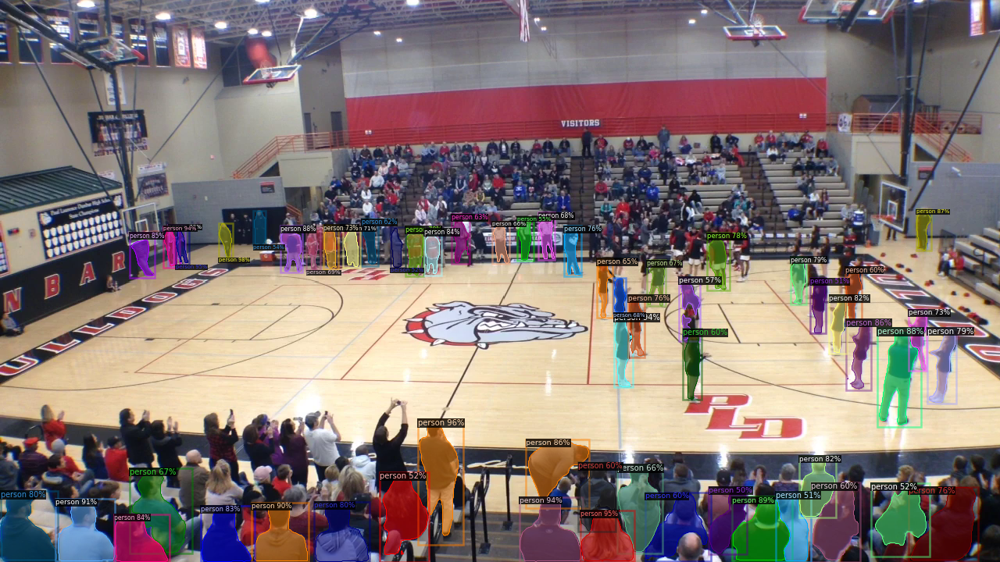

In [ ]:
# We can use `Visualizer` to draw the predictions on the image.
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.0)

v = v.draw_instance_predictions(players_output["instances"].to("cpu"))
cv2_imshow(v.get_image()[:, :, ::-1])

model_final_a6e10b.pkl: 237MB [00:06, 34.8MB/s]                           
/usr/local/lib/python3.7/dist-packages/detectron2/structures/keypoints.py:224: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  y_int = (pos - x_int) // w


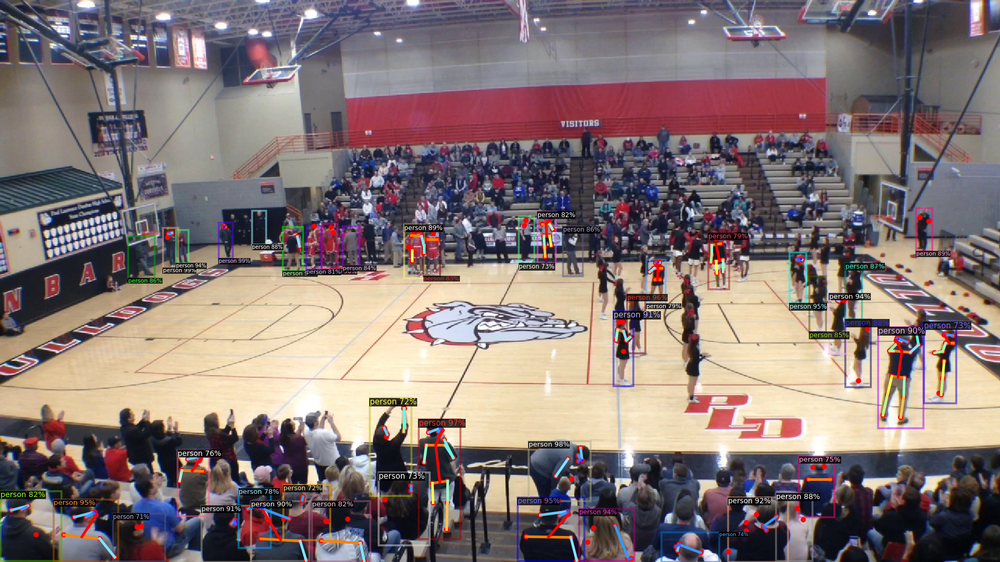

In [ ]:
cfg = get_cfg()
cfg.merge_from_file("./detectron2_repo/configs/COCO-Keypoints/keypoint_rcnn_R_50_FPN_3x.yaml")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7  # set threshold for this model
cfg.MODEL.WEIGHTS = "detectron2://COCO-Keypoints/keypoint_rcnn_R_50_FPN_3x/137849621/model_final_a6e10b.pkl"
predictor = DefaultPredictor(cfg)
outputs = predictor(im)
v = Visualizer(im[:,:,::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.5)
v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(v.get_image()[:, :, ::-1])

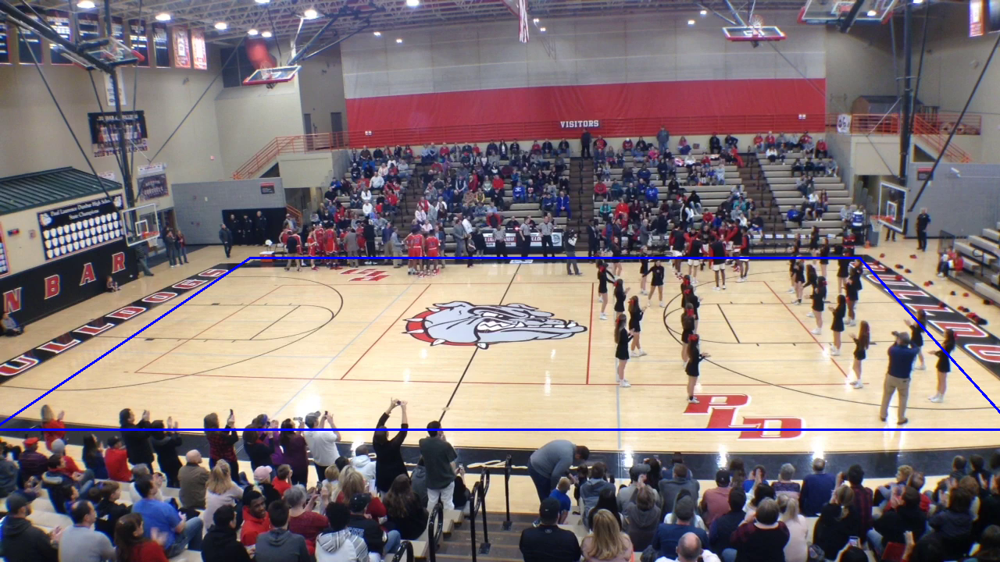

In [ ]:
# Four corners of the 3D court 
# Start top-left corner and go anti-clock wise
src_pts = np.array([
     [320,330],
        [1100,330],
         [1300,550],
         [-10,550],
        
    ])    
src_pts2 = np.array([
     [320,280],
        [1100,330],
         [1340,560],
         [-40,520],
        
    ]) 

im_poly = im.copy()

# cv2.fillPoly(img_src, [src_pts], 255)
cv2.polylines(im_poly, [src_pts], isClosed=True, color=[255,0,0], thickness=2)

cv2_imshow(im_poly)


In [ ]:
# Use the boxes info from the tensor prediction result
#
# x1,y1 ------
# |          |
# |          |
# |          |
# --------x2,y2
#
from shapely.geometry import Point, Polygon
import pandas as pd
import csv
from flask import Flask,jsonify
from flask_ngrok import run_with_ngrok
# Python code for Multiple Color Detection
import numpy as np
import cv2

app = Flask(__name__)
run_with_ngrok(app)


@app.route('/')
def index() :
   return "Welcome"






#!wget http://ai-analytics.asia/img/s5.png -O input.jpg
#imageFrame = cv2.imread("./input.jpg")



# Convert the imageFrame in
# BGR(RGB color space) to
# HSV(hue-saturation-value)
# color space
hsvFrame = cv2.cvtColor(im, cv2.COLOR_BGR2HSV)



# Set range for red color and
# define mask
red_lower = np.array([136, 87, 111], np.uint8)
red_upper = np.array([180, 255, 255], np.uint8)
red_mask = cv2.inRange(hsvFrame, red_lower, red_upper)




# Morphological Transform, Dilation
# for each color and bitwise_and operator
# between imageFrame and mask determines
# to detect only that particular color
kernal = np.ones((5, 5), "uint8")

# For red color
red_mask = cv2.dilate(red_mask, kernal)
res_red = cv2.bitwise_and(im, im,
            mask = red_mask)

# Creating contour to track red color
contours, hierarchy = cv2.findContours(red_mask,
                  cv2.RETR_TREE,
                  cv2.CHAIN_APPROX_SIMPLE)




data = [[10,10],[12,12]]

pos = pd.DataFrame(data,columns=['pos', 'time'])


import time

t = time.process_time()
#elapsed_time = time.process_time() - t

def drawPlayers(im, pred_boxes, showResult=False):
  
  f = open('ab.txt', 'a')
  color1 = [0, 0, 255] 
  color2 = [255, 0, 0] 
  thickness = 5
  radius = 5

  i  = 0
  for box in pred_boxes:
    
    # Include only class Person
    if pred_classes[i] == 0:  
        
      x1 = int(box[0])
      y1 = int(box[1])
      x2 = int(box[2])
      y2 = int(box[3])

      xc = x1 + int((x2 - x1)/2)
      player_pos1 = (xc - 1, y2)
      player_pos2 = (xc + 1, y2 + 1)

      court = Polygon(src_pts)
      court2 = Polygon(src_pts2)

      # Draw only players that are within the basketball court
      if Point(player_pos1).within(court):
        if showResult:
           print(".")

        
        for pic, contour in enumerate(contours):
          area = cv2.contourArea(contour)
          if (area > 300):
            x, y, w, h = cv2.boundingRect(contour)
            
            if Point((x,y)).within(court2):
             
              cv2.rectangle(im, (x,y),(x + w, y + h), (0, 0, 255), 2)
              if (x == x1):    
                #print(x,y,x1,y1)
                cv2.rectangle(im, player_pos1,player_pos2, color1, 10)
                
              else:
                cv2.rectangle(im, player_pos1, player_pos2,color2, thickness)


                
        elapsed_time = time.process_time() - t

        
        #d2 = cv2.rectangle(im, player_pos1, player_pos2, color, thickness)

          

       
       # print("Pos1 " + str(player_pos1) + "Pos2"+ str(player_pos2)+ "time "+str(elapsed_time), file = f)
      
        pos.append({'pos': player_pos1[0],'time': elapsed_time},ignore_index=True)
        #print(player_pos2)

        i = i + 1  

  if showResult:
    cv2_imshow(im)


  pos.to_csv('pos1.csv', index=False)
  f.close()
  return pos.to_json(orient="split")
# drawPlayers(im, pred_boxes, True)
  #return str(drawPlayers(im, pred_boxes, True))

def getData():
    return '{data:[1,2,]}'


@app.route("/ex", methods=['GET'])
def get():
  im = cv2.imread("./input.jpg")
  cfg = get_cfg()
#cfg.merge_from_other_cfg
  cfg.merge_from_file("./detectron2_repo/configs/COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")

  cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # set threshold for this model

  cfg.MODEL.WEIGHTS = "detectron2://COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x/137849600/model_final_f10217.pkl"

  predictor = DefaultPredictor(cfg)

  players_output = predictor(im)

# look at the outputs. See https://detectron2.readthedocs.io/tutorials/models.html#model-output-format for specification
  instances = players_output["instances"]
  # print(instances)
  pred_boxes = instances.get("pred_boxes")
  
  return drawPlayers(im, pred_boxes)
  # return jsonify('{data:[1,2,4]}')

if __name__ == "__main__":
    app.run()

 * Serving Flask app "__main__" (lazy loading)
 * Environment: production
   Use a production WSGI server instead.
 * Debug mode: off


 * Running on http://127.0.0.1:5000/ (Press CTRL+C to quit)


 * Running on http://6db6-34-86-247-166.ngrok.io
 * Traffic stats available on http://127.0.0.1:4040


127.0.0.1 - - [24/Jan/2022 05:18:36] "GET / HTTP/1.1" 200 -
127.0.0.1 - - [24/Jan/2022 05:18:36] "GET /favicon.ico HTTP/1.1" 404 -
127.0.0.1 - - [24/Jan/2022 05:18:44] "GET /ex HTTP/1.1" 200 -
127.0.0.1 - - [24/Jan/2022 05:18:45] "GET /favicon.ico HTTP/1.1" 404 -


/usr/local/lib/python3.7/dist-packages/detectron2/structures/keypoints.py:224: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').


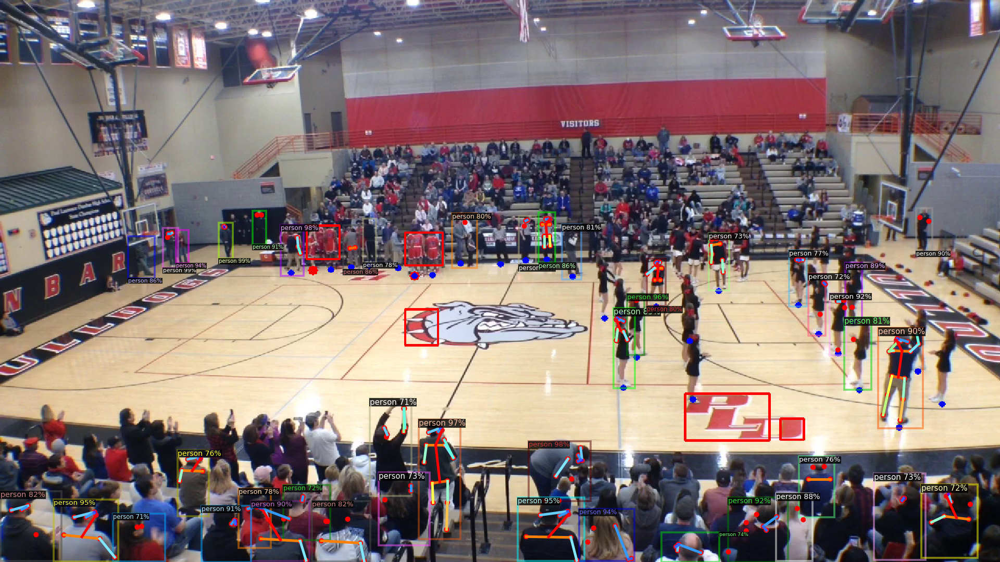

In [ ]:
cfg = get_cfg()
cfg.merge_from_file("./detectron2_repo/configs/COCO-Keypoints/keypoint_rcnn_R_50_FPN_3x.yaml")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7  # set threshold for this model
cfg.MODEL.WEIGHTS = "detectron2://COCO-Keypoints/keypoint_rcnn_R_50_FPN_3x/137849621/model_final_a6e10b.pkl"
predictor = DefaultPredictor(cfg)
outputs = predictor(im)
v = Visualizer(im[:,:,::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.5)
v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(v.get_image()[:, :, ::-1])

In [ ]:
'''for det_keypoints in outputs["instances"].pred_keypoints:
  person_keypoint={
  "date_time":time.ctime(),
  "nose":{'x':str(det_keypoints.cpu().numpy()[0][0]),'y': str(det_keypoints.cpu().numpy()[0][1]), 'conf': str(det_keypoints.cpu().numpy()[0][2])},
  "left_eye":{'x':str(det_keypoints.cpu().numpy()[1][0]),'y': str(det_keypoints.cpu().numpy()[1][1]), 'conf': str(det_keypoints.cpu().numpy()[1][2])},
  "right_eye":{'x':str(det_keypoints.cpu().numpy()[2][0]),'y': str(det_keypoints.cpu().numpy()[2][1]), 'conf': str(det_keypoints.cpu().numpy()[2][2])},
  "left_ear":{'x':str(det_keypoints.cpu().numpy()[3][0]),'y': str(det_keypoints.cpu().numpy()[3][1]), 'conf': str(det_keypoints.cpu().numpy()[3][2])},
  "right_ear":{'x':str(det_keypoints.cpu().numpy()[4][0]),'y': str(det_keypoints.cpu().numpy()[4][1]), 'conf': str(det_keypoints.cpu().numpy()[4][2])},
  "left_shoulder":{'x':str(det_keypoints.cpu().numpy()[5][0]),'y': str(det_keypoints.cpu().numpy()[5][1]), 'conf': str(det_keypoints.cpu().numpy()[5][2])},
  "right_shoulder":{'x':str(det_keypoints.cpu().numpy()[6][0]),'y': str(det_keypoints.cpu().numpy()[6][1]), 'conf': str(det_keypoints.cpu().numpy()[6][2])},
  "left_elbow":{'x':str(det_keypoints.cpu().numpy()[7][0]),'y': str(det_keypoints.cpu().numpy()[7][1]), 'conf': str(det_keypoints.cpu().numpy()[7][2])},
  "right_elbow":{'x':str(det_keypoints.cpu().numpy()[8][0]),'y': str(det_keypoints.cpu().numpy()[8][1]), 'conf': str(det_keypoints.cpu().numpy()[8][2])},
  "left_wrist":{'x':str(det_keypoints.cpu().numpy()[9][0]),'y': str(det_keypoints.cpu().numpy()[9][1]), 'conf': str(det_keypoints.cpu().numpy()[9][2])},
  "right_wrist":{'x':str(det_keypoints.cpu().numpy()[10][0]),'y': str(det_keypoints.cpu().numpy()[10][1]), 'conf': str(det_keypoints.cpu().numpy()[10][2])},
  "left_hip":{'x':str(det_keypoints.cpu().numpy()[11][0]),'y': str(det_keypoints.cpu().numpy()[11][1]), 'conf': str(det_keypoints.cpu().numpy()[11][2])},
  "right_hip":{'x':str(det_keypoints.cpu().numpy()[12][0]),'y': str(det_keypoints.cpu().numpy()[12][1]), 'conf': str(det_keypoints.cpu().numpy()[12][2])},
  "left_knee":{'x':str(det_keypoints.cpu().numpy()[13][0]),'y': str(det_keypoints.cpu().numpy()[13][1]), 'conf': str(det_keypoints.cpu().numpy()[13][2])},
  "right_knee":{'x':str(det_keypoints.cpu().numpy()[14][0]),'y': str(det_keypoints.cpu().numpy()[14][1]), 'conf': str(det_keypoints.cpu().numpy()[14][2])},
  "left_ankle":{'x':str(det_keypoints.cpu().numpy()[15][0]),'y': str(det_keypoints.cpu().numpy()[15][1]), 'conf': str(det_keypoints.cpu().numpy()[15][2])},
  "right_ankle":{'x':str(det_keypoints.cpu().numpy()[16][0]),'y': str(det_keypoints.cpu().numpy()[16][1]), 'conf': str(det_keypoints.cpu().numpy()[16][2])}
  }'''

'for det_keypoints in outputs["instances"].pred_keypoints:\n  person_keypoint={\n  "date_time":time.ctime(),\n  "nose":{\'x\':str(det_keypoints.cpu().numpy()[0][0]),\'y\': str(det_keypoints.cpu().numpy()[0][1]), \'conf\': str(det_keypoints.cpu().numpy()[0][2])},\n  "left_eye":{\'x\':str(det_keypoints.cpu().numpy()[1][0]),\'y\': str(det_keypoints.cpu().numpy()[1][1]), \'conf\': str(det_keypoints.cpu().numpy()[1][2])},\n  "right_eye":{\'x\':str(det_keypoints.cpu().numpy()[2][0]),\'y\': str(det_keypoints.cpu().numpy()[2][1]), \'conf\': str(det_keypoints.cpu().numpy()[2][2])},\n  "left_ear":{\'x\':str(det_keypoints.cpu().numpy()[3][0]),\'y\': str(det_keypoints.cpu().numpy()[3][1]), \'conf\': str(det_keypoints.cpu().numpy()[3][2])},\n  "right_ear":{\'x\':str(det_keypoints.cpu().numpy()[4][0]),\'y\': str(det_keypoints.cpu().numpy()[4][1]), \'conf\': str(det_keypoints.cpu().numpy()[4][2])},\n  "left_shoulder":{\'x\':str(det_keypoints.cpu().numpy()[5][0]),\'y\': str(det_keypoints.cpu().numpy()

In [ ]:
!wget http://bluechipai.asia/vid/s5.png -O court.jpg

--2022-01-12 08:10:46--  http://bluechipai.asia/vid/s5.png
Resolving bluechipai.asia (bluechipai.asia)... 173.201.177.241
Connecting to bluechipai.asia (bluechipai.asia)|173.201.177.241|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1356517 (1.3M) [image/png]
Saving to: ‘court.jpg’

court.jpg           100%[===================>]   1.29M  1.06MB/s    in 1.2s    

2022-01-12 08:10:47 (1.06 MB/s) - ‘court.jpg’ saved [1356517/1356517]



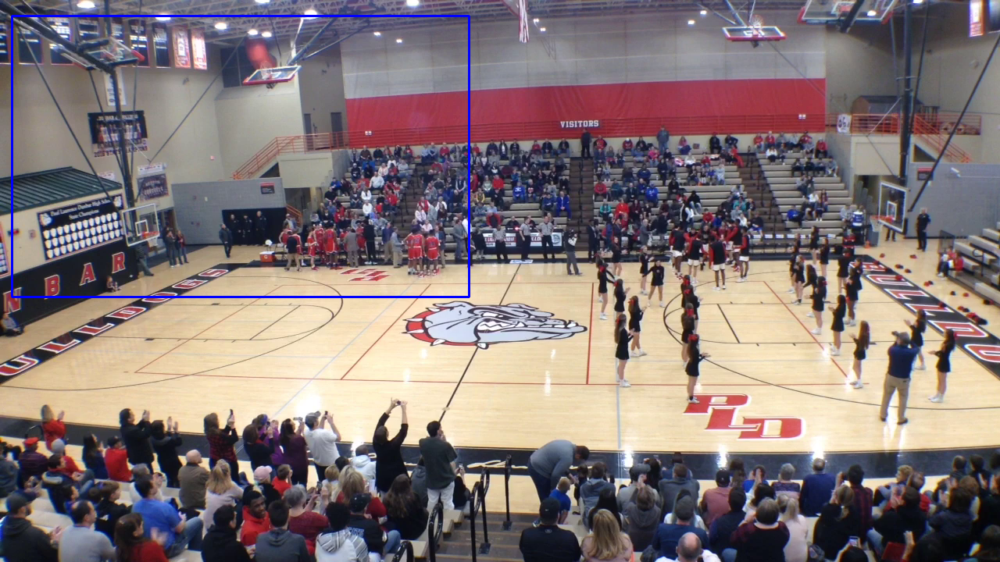

In [ ]:
img_dst = cv2.imread('./court.jpg')

# Four corners of the court + mid-court circle point in destination image 
# Start top-left corner and go anti-clock wise + mid-court circle point
dst_pts = np.array([
     [15,20],
        [600,20],
         [600,380],
         [15,380],
        
     
    ])   

cv2.polylines(img_dst, [dst_pts], isClosed=True, color=[255,0,0], thickness=2)
cv2_imshow(img_dst)

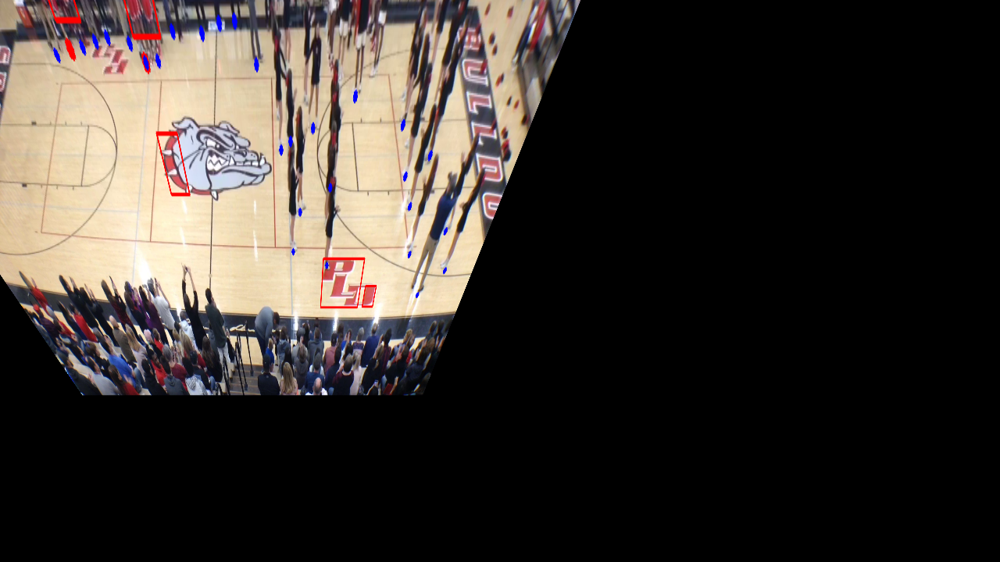

In [ ]:
def homographyTransform(im, showResult=False):

  # Calculate Homography
  h, status = cv2.findHomography(src_pts, dst_pts)
  img_out = cv2.warpPerspective(im, h, (img_dst.shape[1], img_dst.shape[0]))
  
  if showResult:
    cv2_imshow(img_out)

  return img_out  

# Try out
img_out = homographyTransform(im, True)  

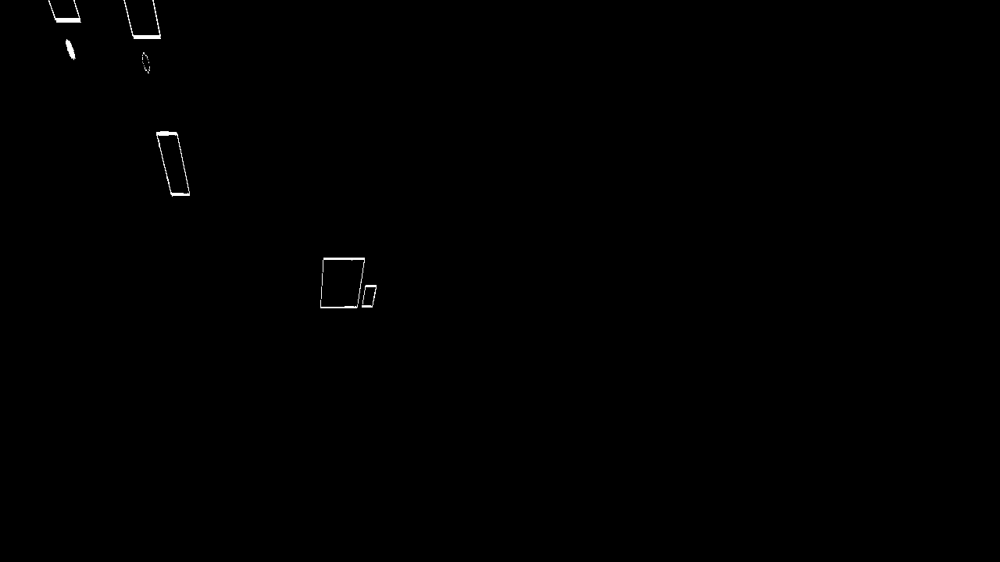

In [ ]:
def getPlayersMask1(im):
  lower_range_red = np.array([0,0,255])                         # Set the Lower range value of blue in BGR
  upper_range_red = np.array([255, 153, 255])                   # Set the Upper range value of blue in BGR
 
  mask1 = cv2.inRange(im, lower_range_red, upper_range_red)   # Create a mask with range


  result1 = cv2.bitwise_and(im, img_out, mask = mask1)  # Performing bitwise and operation with mask in img variable

  # cv2_imshow(result)                              

  return cv2.inRange(result1,lower_range_red, upper_range_red)  
  
  
# Try out  
mask1 = getPlayersMask1(img_out)    
cv2_imshow(mask1)



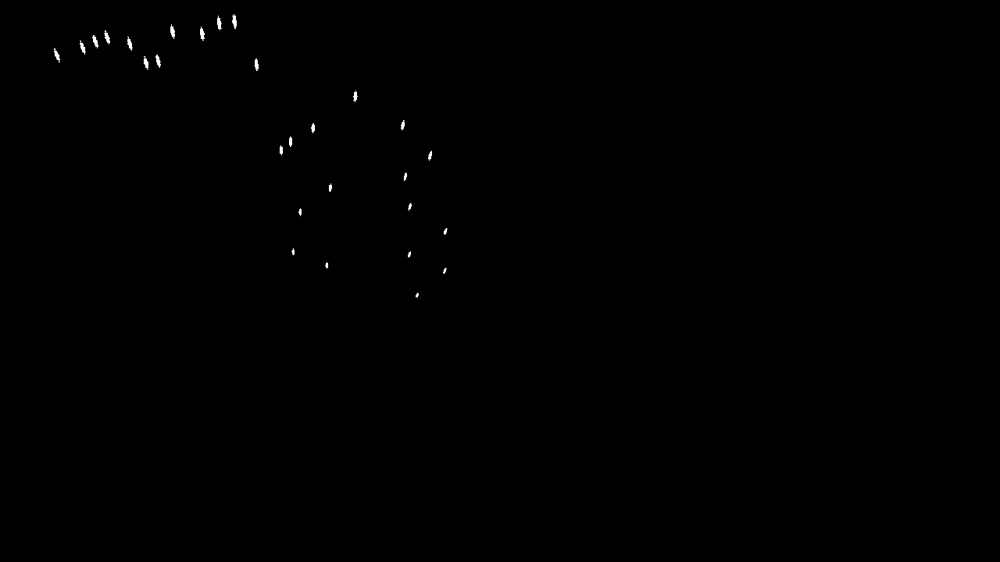

In [ ]:
def getPlayersMask2(im):
  lower_range_blue = np.array([255,0,0])                         # Set the Lower range value of blue in BGR
  upper_range_blue = np.array([255,155,155])                     # Set the Upper range value of blue in BGR

  # Create a mask with range
  mask2 = cv2.inRange(im, lower_range_blue,upper_range_blue) 

  result2 = cv2.bitwise_and(im, img_out, mask = mask2)  # Performing bitwise and operation with mask in img variable
  # cv2_imshow(result)                              

  return cv2.inRange(result2, lower_range_blue,upper_range_blue)  
  
  
mask = getPlayersMask2(img_out)    
cv2_imshow(mask)

In [ ]:
def drawPlayersOnCourt(im, coord, color1,color2, radius=10):
  for pos in coord:
    center_coordinates = (pos[0], pos[1])
    cv2.circle(im, center_coordinates, radius, color1, thickness=-1) 
    cv2.circle(im, center_coordinates, radius, color2, thickness=-1) 

  return im

In [ ]:
!wget http://bluechipai.asia/vid/abc.mp4 -O video.mp4

In [ ]:
# Draft method to draw lines between history player positions to show trail
def drawCoordinateLines(result1,resul2, pts, currentFrame, player):
  
  for i in np.arange(1, len(pts)):
    
    # if either of the tracked points are None, ignore them
    if pts[i - 1] is None or pts[i] is None:
      continue

    thickness = int(np.sqrt(30 / float(i + 1)) * 2.5)
    print("player=%s" %player)
    x1 = pts[i - 1][0][0]
    x2 = pts[i - 1][0][1]
    print("x1=%d, x2=%d" %(x1, x2))
    y1 = pts[i][0][0]
    y2 = pts[i][0][1]
    print("y1=%d, y2=%d" %(y1, y2))
    print(" ---------------------- ")
    cv2.line(result, (x1, x2), (y1, y2), red_color, thickness)

  return result1,result2

[=                                                                       ] 100%

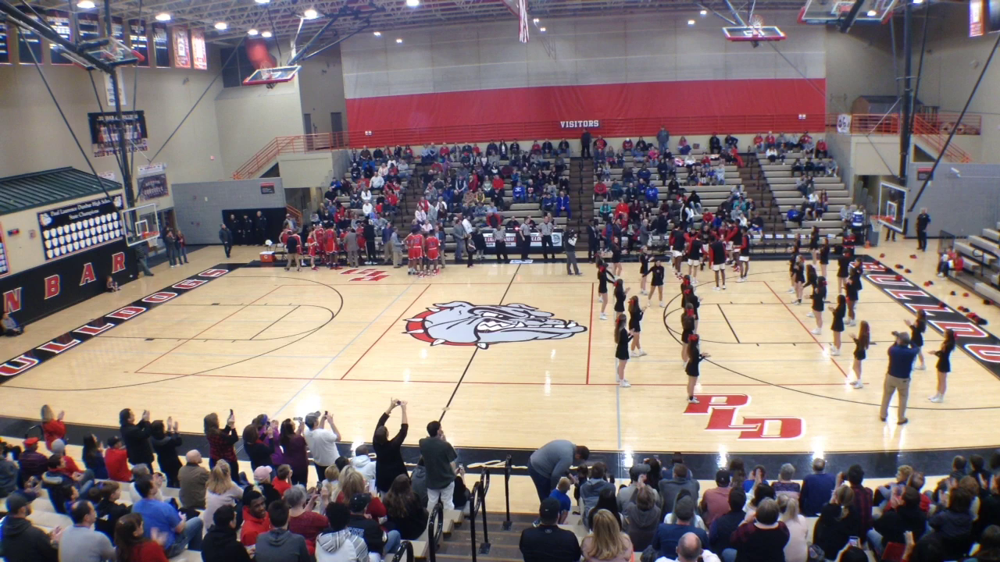

NameError: ignored

In [ ]:
import time
import progressbar
from time import sleep
from collections import deque
from detectron2.utils.visualizer import ColorMode
from detectron2.utils.visualizer import GenericMask
import imutils

vs = cv2.VideoCapture("./video.mp4")
totalFrames = int(vs.get(cv2.CAP_PROP_FRAME_COUNT))

grabbed = True
currentFrame = 0
start = time.time()
writer = None

bar = progressbar.ProgressBar(maxval=totalFrames, \
      widgets=[progressbar.Bar('=', '[', ']'), ' ', progressbar.Percentage()])

bar.start()

court_img = cv2.imread('court.jpg')
cv2_imshow(court_img)
blue_color = (255,0,0)
red_color = (0,0,255)


# loop over frames from the video file stream (207)
while grabbed:     
  
  # read the next frame from the file
  (grabbed, frame) = vs.read()

  if writer is None:
    fourcc = cv2.VideoWriter_fourcc(*"mp4v")
    writer = cv2.VideoWriter("output.mp4", fourcc, 24, (court_img.shape[1], court_img.shape[0]), True)

  if grabbed:
    # print(currentFrame)
  
    # Get player positions
    outputs = predictor(frame)  
    instances = outputs["instances"].to("cpu")
    boxes = instances.get("pred_boxes")

    court = court_img.copy()

    # Draw players on video frame
    drawPlayers(frame, boxes, False)
    
    img_out = homographyTransform(frame, False)
    # cv2_imshow(img_out)

    mask = getPlayersMask2(img_out)
    
    # cv2_imshow(mask)

    # Get the contours from the players "dots" so we can reduce the coordinates
    # to the number of players on the court.
    cnts = cv2.findContours(mask.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cnts = imutils.grab_contours(cnts)
  
    if cnts is not None:      
      for cnt in cnts:
        result = drawPlayersOnCourt(court, cnt[0], blue_color, red_color)
                               
    writer.write(result)

    currentFrame += 1
    bar.update(currentFrame)
  
  else:
      grabbed = False

cv2_imshow(result)
    
writer.release()
vs.release()
bar.finish()

end = time.time()
elap = (end - start)
print("[INFO] process took {:.4f} seconds".format(elap))

print("Video created")

In [ ]:
from google.colab import files
files.download('output.mp4') 